reference: 
- http://iopenshell.usc.edu/people/thesis-gunina.pdf
- http://iopenshell.usc.edu/downloads/ezdyson/ezDysonManual.pdf

to do:
- extract the radial part of the atomic HF orbital in order to use it for the atomic case
- exercices with derivations ?

# Photoionization cross section

## Prerequisit

This is an advance topic.
The necessary prerequesit are following:
- HF theory
- Basic of light-matter interaction (transition dipole moment)
- Numercial integration
- Advance visualization in python
- Basic of angular momentum theory

## Forewords


In this second module, you will calculate the photoionization cross section for molecule and atoms.
From Wikipedia: Photoionization is the physical process in which an ion is formed from the interaction of a photon with an atom or molecule.
Each ployelectronic atom or molecule is characterized by a first, second, etc ionization energy, corresponding to the energy needed to detach the most loosely bond electron, the second one and so forth.
The cross-section associated to an ionization process 

Important: in the following we use the mathematical convention (used by Python) for the spherical coordinates: $\theta$ is the azimuthal angle ($2\pi>\theta>0$) and $\phi$ is the polar angle ($\pi>\phi>0$). It is common to see the opposite convention. The conversion from spherical to cartesian coordinates is therefore given by:

$$x=rsin(\phi)cos(\theta)$$
$$y=rsin(\phi)sin(\theta)$$
$$z=rcos(\phi)$$

The quantum chemistry program that is used is PySCF (\url{https://sunqm.github.io/pyscf/}). You will not directly deal with PySCF's syntax but rather use a class that will allow you to perform the needed calculations and extract the results through a simplified syntax. 

The questions have been highlighted in green, red and blue, with the following meaning:
- green: the answer does not have to appear in the report.
- blue: these questions involve plotting. They have to appear as figures in the report, along with a caption, legend and axis title. In addition, a short discription of the observed features must be given.
- red: a written answer must be given.  

## Needed function and wrappers

In [2]:
import numpy as np
import math
import matplotlib.pyplot as plt

from scipy import integrate, special
from scipy.interpolate import RegularGridInterpolator

from sympy.physics.quantum.cg import CG
from pyscf import gto, scf, adc, lib
import plotly.graph_objects as go
import plotly.io as pio

def phi_e(k_vector,r_pts, grid=False):
    '''
    plane wave as complex exponential

    if grid is True, r_pts must be a list of meshgrid.
    '''

    if grid:
        pts = mesh2pos(r_pts)
    else:
        pts = r_pts.copy()

    ans = np.zeros(len(pts), dtype=complex)
    pre = 1/np.sqrt(2*np.pi**(3))
    for i,rr in enumerate(pts):
        e = np.exp(complex(0,1)*np.dot(k_vector,rr))
        ans[i] = e

    if grid:
        ans = ans.reshape([s.shape[0] for s in r_pts])

    return ans

def get_dys_coeff(mf, mol):

    # ADC(3) - IP calculation
    myadc = adc.ADC(mf)
    myadc.method = "adc(3)"
    myadc.method_type = "ip"
    eip,vip,pip,xip = myadc.kernel(nroots=1)

    # dyson orbital
    return myadc.compute_dyson_mo()

def get_dyson(X, Y, Z, mol):
    """
    get the value of the dyson orbital for CO in real space on a grid
    X,Z,Y are 1D arrays (not grid!)
    """
    
    # HF calculation
    mf = scf.RHF(mol)
    mf.run()

    # ADC(3) - IP calculation
    myadc = adc.ADC(mf)
    myadc.method = "adc(3)"
    myadc.method_type = "ip"
    myadc.kernel(nroots=1)

    # dyson orbital
    coeff = myadc.compute_dyson_mo()
    
    nx = len(X)
    ny = len(Y)
    nz = len(Z)
    npts = nx * ny * nz
    #if npts > 50000:
    #    raise ValueError("Number of grid points too large")
    
    # npts x 3 array corresponding to cartesian coordinates
    coords_cart = lib.cartesian_prod([X, Y, Z])

    # Compute orbital values on coord
    ao = mol.eval_gto("GTOval", coords_cart)
    orb_on_coord = np.dot(ao, coeff)

    # convert to mesh
    orb_on_grid = np.zeros((nx, ny, nz))
    for ix in range(nx):
        for iy in range(ny):
            orb_on_grid[ix, iy, :] = orb_on_coord[nz*ny*ix + iy*nz: nz*ny*ix + iy*nz + nz].ravel()

    return orb_on_coord

def get_orb_pts(coeff, mol, coords, grid=False):

    # npts x 3 array corresponding to cartesian coordinates
    coords_cart = lib.cartesian_prod(coords)

    # Compute orbital values on coord
    ao = mol.eval_gto("GTOval", coords_cart)
    orb_on_coord = np.dot(ao, coeff)

    if grid:
        # convert to mesh

        nx = len(coords[0])
        ny = len(coords[1])
        nz = len(coords[2])
        orb_on_grid = np.zeros((nx, ny, nz))

        for ix in range(nx):
            for iy in range(ny):
                orb_on_grid[ix, iy, :] = orb_on_coord[nz*ny*ix + iy*nz: nz*ny*ix + iy*nz + nz].ravel()

        return orb_on_grid
    else:
        return orb_on_coord

def cart2sph(x, y, z):
    r = np.sqrt(x**2+y**2+z**2)
    phi = np.arccos(z/r)
    theta = np.arctan2(x,y)
    phi[np.isnan(phi)] = 0
    return r, theta, phi

def sph2cart(r, theta, phi):
    x = r * np.sin(phi) * np.cos(theta)
    y = r * np.sin(phi) * np.sin(theta)
    z = r * np.cos(phi)
    return x, y, z

def phi_e_hs(k,lmax,r,th,ph, angle_e=None):
    
    if angle_e is not None:
        th_k,ph_k = angle_e
        Ye  = special.sph_harm
    else:
        Ye = lambda ml,l,th_k,ph_k: 1
        th_k = ph_k = 0

    Y  = special.sph_harm
    jl = special.spherical_jn
    
    i = complex(0,1)
    prefactor = (2/(math.sqrt(2*np.pi)))
    
    ans = 0
    for l in range(lmax+1):
        rad = jl(l,k*r)
        if l == 0:
          ans += (i**l)*rad*Y(0,0,th,ph)*Ye(0,0,th_k,ph_k)
        else:
           for m in range(-l,l+1,1):
               ans += (i**l)*rad*Y(m,l,th,ph)*Ye(0,l,th_k,ph_k)
    
    return ans*prefactor

# numerical integration
def triple_trap(na, nb, nc, ai, af, bi, bf, ci, cf, intD, *arg):
    
    # integration steps
    da = (af-ai)/na
    db = (bf-bi)/nb
    dc = (cf-ci)/nc  
    
    ans = 0.
    for j in range(na-1):
        for k in range(nb-1):
            for l in range(nc-1):
                aj = ai + da/2 + j*da
                bk = bi + db/2 + k*db
                cl = ci + dc/2 + l*dc
                ans += da*db*dc*intD(aj,bk,cl,*arg)
    
    return ans

def triple_trap_grid(N, ini, final, intD, *arg):
    
    # integration steps
    d = (final-ini)/N 
    arr = np.linspace(ini, final,N)

    # coord
    int_coord = intD(arr,arr,arr,*arg)

    # convert to mesh
    int_on_grid = np.zeros((N, N, N))
    for ix in range(N):
        for iy in range(N):
            int_on_grid[ix, iy, :] = int_coord[N*N*ix + iy*N: N*N*ix + iy*N + N].ravel()

    return np.sum(int_on_grid*d**3)

def cgc(j1, m1, j2, m2, j3, m3):
    """
    uses the sympy module to calculate the Clebsch Gordan coefficients
    <j1m1j2m2|j3m3>
    """

    cg = CG(j1,m1,j2,m2,j3,m3).doit().evalf()
    
    return cg

def ang_part(j1,m1,j2,m2,j3,m3):
    '''
    Calculates the integral of 3 harmonic spherics
    '''

    cg1 = CG(j1,m1,j2,m2,j3,m3).doit().evalf()
    cg2 = CG(j1,0,j2,0,j3,0).doit().evalf()
    ans = cg1*cg2*np.sqrt((2*j1+1)*(2*j2+1)/(4*np.pi*(2*j3+1)))

    return ans

# Hydrogen-like wave function
def Psi(n, l, m, co1, co2, co3, Zeff, spherical=True):
    """
    n: principal quantum number
    l: azimuthal quantum number
    m: magnetic quantum number
    co1m co2m co3: 
        r, phi and thet if spherical is True
        x, z, z cartesian coordinates if spherical is False
    Z: nuclear charge
    
    return the radial part R and the angular part Y
    """

    if spherical:
        r, thet, phi = co1, co2, co3
    else:
        r, thet, phi = cart2sph(co1,co2,co3)

    # angular part -> spherical harmonics
    Y = special.sph_harm(m,l,thet,phi)

    # radial part containing the associated Laguerre polynomials
    R = np.sqrt((math.factorial(n-l-1)*(2*Zeff/n)**3)/(2*n*math.factorial(n+l)))
    R *= (2*r*Zeff/n)**l
    R *= np.exp(-Zeff*r/n)
    x = 2*r*Zeff/n
    R *= special.assoc_laguerre(x,n-l-1,2*l+1)

    psi = Y*R

    return psi, R, Y

def mesh2pos(mesh):
    return np.vstack(list(map(np.ravel, mesh))).T


## 1) Visualization of the free electron`s wave function

### Theory part I: dipole transition moment and the free electron`s wavefunction

The transition dipole moment of an ionization process involves a bound and a continuum state as initial and final state, respectively. If one describes the ejected electron as a free particle (hence neglecting the interaction between the ejected electron and the $N-1$ core), the final state can be expressed as a product between a bound state and a continuum state $\Psi_{f}=\Psi^{N-1}\Phi_k$, where $\Phi_k$ describes the ejected electron and $\Psi^{N-1}$ the remaining atom or molecule with N-1 electrons. The transition moment becomes: 

$$D_k = <\Psi^{N-1}\Phi_k|\hat{r}|\Psi^{N}>$$

In an independent electron picture, $i.e$ when the polyelectronic final bound state $\Psi^{N-1}$ is described by a single electron wave function $\Phi_{i}$, the integral simplifies to: 

$$<\Phi_k|\hat{r}|\Phi_{i}>$$

$\Phi_i$ represents the initial state of the electron before being promoted into the continuum during the ionisation process. Depending on how $\Phi_i$ is obtained, several effects can be taken into account. The simpliest picture would be to take $\Phi_i$ as the Hartree-Fock orbital from which the electron is detached, this is reffered to as Koopman's theorem. This leads to the neglect of electron correlation and orbital relaxation effects. Alternatively, one can use more sophisticated one electron wave function such as dyson orbitals (see Theory part III below). 

The free electron wave function can be expressed as a plane wave (solution of the potential-less Schrödinger equation):

$$\Phi_k(\vec{k},\vec{r}) = \frac{1}{(2\pi)^{\frac{3}{2}}}e^{i\vec{k}\vec{r}}$$

where $\vec{k}$ is the wave vector of the ejected electron pointing in the direction in which the plane wave travels, and $\vec{r}$ is the position vector $\vec{r}=(r,\theta,\phi)$. The prefactor is a normalization constant.  

We have written a function that returns the free electron's wave function (the plane wave). The function *phi_e(k_vector, r_pts)* takes 2 arguments: i)*k_vector=[kx,ky,kz]*, which is an array of length 3 for each of the 3 components of the k vector and ii) *r_pts* a list of 3 dimension arrays corresponding to a list of coordinates for the vector **r**.
For example, the following lines of code calculate the value of the plane wave with momentum *|k|=1* travellig in the z-direction (thus *k_vector=[0,0,1]*) at *r1=[0,0,0]* and *r2=[1,1,1]* coordinates:  

In [10]:
k_vector=np.array([0,0,1])
r1 = [0,0,0]
r2= [1,1,1]
r_pts =np.array([r1,r2])
pw = phi_e(k_vector, r_pts)

print("The value of the plane wave with momentum k=1")
print("at 0,0,0 is ", pw[0])
print("at 1,1,1 is ", pw[1])

print()
print("The value of probabilty density")
print("at 0,0,0 is ", np.abs(pw[0].real* pw[0].imag))
print("at 1,1,1 is ", np.abs(pw[1].real* pw[1].imag))

The value of the plane wave with momentum k=1
at 0,0,0 is  (1+0j)
at 1,1,1 is  (0.5403023058681398+0.8414709848078965j)

The value of probabilty density
at 0,0,0 is  0.0
at 1,1,1 is  0.4546487134128409


<font color='blue'>**1-i) Use the *phi_e* function to plot the 1D probabilty density of the plane wave for various cases: different *k_vector* (direction for the travelling wave and a momentum) and a set of points where the values will be calculated** 

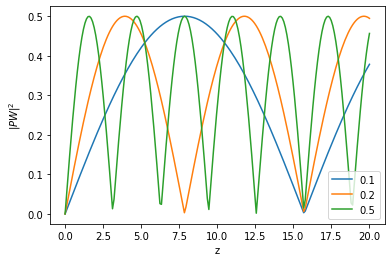

In [13]:
# z-travelling wave oberved along the z direction

# choose z pts
z = np.linspace(0,20,200)

# create set of r points
r_pts = np.array([[0,0,zz] for zz in z])

# 
for k in [0.1, 0.2,0.5]:

    k_vect = np.array([0,0,k])
    pw = phi_e(k_vect,r_pts)
    #plt.plot(z, pw.imag)
    #plt.plot(z, pw.real)
    plt.plot(z, np.abs(pw.real*pw.imag), label=str(k))

plt.legend()
plt.xlabel('z')
plt.ylabel("$|PW|^2$")
plt.show()

<font color='blue'>**1-ii) Plot the probabilty density on a 2D plane.**

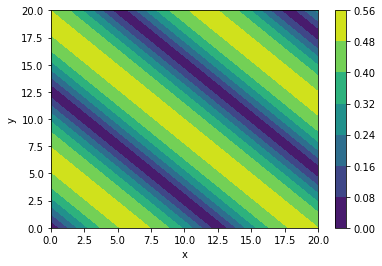

In [61]:
# xy-travelling wave oberved along on the xy plane

# choose xy pts
xy= np.linspace(0,20,20)

# create mesh grid
mesh = np.meshgrid(xy,xy,np.zeros(20))
#pos = mesh2pos(grid)

k = 0.5
kxy = k**2/2 
k_vect = np.array([kxy,kxy,0])

pw = phi_e(k_vect,mesh, grid=True)
pw = np.abs(pw.real*pw.imag)
plt.contourf(xy, xy,pw[:,:,0])

plt.colorbar()
plt.xlabel('x')
plt.ylabel("y")
plt.show()

<font color='blue'>**1-iii) Plot the probabilty density on a 3D plane.**

In [63]:
lim = 5
k = 0.5

x = np.linspace(-lim,lim,30)
y = np.linspace(-lim,lim,30)
z = np.linspace(-lim,lim,30)
mesh = np.meshgrid(x, y, z)
#r_vect = np.array([[xx,yy,zz] for xx,yy,zz in zip(X.flatten(),Y.flatten(),Z.flatten())])

ans = phi_e([0,0,k], mesh, grid=True)
pw = ans.real*np.conjugate(ans.imag)

fig= go.Figure(data=go.Isosurface(
    x=mesh[0].flatten(),
    y=mesh[1].flatten(),
    z=mesh[2].flatten(),
    value=pw.flatten(),
    opacity=0.5,
    isomin=np.min(pw),
    isomax=np.max(pw),
    surface_count=15,
    #caps=dict(x_show=False, y_show=False)
    ))

fig.show()

## 2) Plane wave as expansion in spherical harmonics

### Theory part II: expansion in spherical harmonics

Expressing the plane wave as an expansion over spherical harmonics, one obtains the following expression: 

$$\Phi_k(\vec{k},\vec{r}) = \frac{2}{\sqrt{2\pi}} \sum_{l=0}^{\infty}\sum_{m=-l}^{l} i^lR_l(kr)Y_{l}^{m}(\theta_k, \phi_k)Y_{l}^{m*}(\theta, \phi)$$ 

where $R_l(kr)$ is radial part. For a "pure" plane wave,  $R_l(kr)$ is given by the spherical Bessel function $j_l(kr)$ (which can be retrieved from the 'scipy.special' package by means of 'special.spherical\_jn(l,kr)'). Here we assume that the ejected electron does not interact with the remaing $N-1$ core. This is of course an approximation since the electron does interacts with the remaining core.

###

<font color='green'> **2-i) Write down a function *phi_e_sh* that returns the value of the plane wave for a given $\Phi_k$ for a given $k, l_{max},r, \theta$, $\phi$, $\theta_k$ and $\phi_{k}$**


In [46]:
def phi_e_hs(k,lmax,r,th,ph, angle_e=None):
    
    if angle_e is not None:
        th_k,ph_k = angle_e
        Ye  = special.sph_harm
    else:
        Ye = lambda ml,l,th_k,ph_k: 1
        th_k = ph_k = 0

    Y  = special.sph_harm
    jl = special.spherical_jn
    
    i = complex(0,1)
    prefactor = (2/(math.sqrt(2*np.pi)))
    
    ans = 0
    for l in range(lmax+1):
        rad = jl(l,k*r)
        if l == 0:
          ans += (i**l)*rad*Y(0,0,th,ph)*Ye(0,0,th_k,ph_k)
        else:
           for m in range(-l,l+1,1):
               ans += (i**l)*rad*Y(m,l,th,ph)*Ye(0,l,th_k,ph_k)
    
    return ans*prefactor

<font color='blue'> **2-i) Compare the "original" definition of the plane wave (using the *phi_e* function) and your function *phi_e_hs***

## 3) Photoionization for a molecule: OH $^-$

The following lines of code store the molecular coefficients (or LCAO coefficients) of the HOMO HF orbital and dyson orbital of OH $^-$ in the variabl *hf_homo* and *dys_oh*, respectively.

In [12]:
mol_oh = gto.M(atom='O 0 0 0; H 0 0 0.9', spin=0, charge=-1, basis = '6-311+g')

mf_oh = scf.RHF(mol_oh)
mf_oh.run()

# store coefficient for HF HOMO
hf_homo = mf_oh.mo_coeff[:,4]
# store coefficient for the dyson orbital
dys_oh = get_dys_coeff(mf_oh, mol_oh)

converged SCF energy = -75.3803965705625
E_corr = -0.16509273


<font color='blue'>**3-i) Use the function *get_orb_pts* to calculate the value of the molecular orbital (Dyson or HF) on a grid. Then plot it on a 3D surface.**

In [13]:
lim=2

x = np.linspace(-lim,lim,30)
y = np.linspace(-lim,lim,30)
z = np.linspace(-lim,lim,30)
X,Y,Z = np.meshgrid(x, y, z)

orb_grid = get_orb_pts(dys_oh, mol_oh, (x,y,z),grid=True)
orb_grid = np.abs(orb_grid)**2

fig= go.Figure(data=go.Isosurface(
    x=X.flatten(),
    y=Y.flatten(),
    z=Z.flatten(),
    value=orb_grid.flatten(),
    opacity=0.6,
    isomin=np.min(orb_grid),
    isomax=0.1,#np.max(oh_dys_prob),
    surface_count=9,
    caps=dict(x_show=False, y_show=False)
    ))

#fig.update_scenes(xaxis_visible=False, yaxis_visible=False,zaxis_visible=False )
fig.show()


### Theory part III: calculating the photoionization cross section

The partial differential photoionisation cross section is given by:

$$\frac{\partial \sigma_{k}}{\partial \Omega}=4\pi^2\, \alpha \, \omega_{in} \, m_e \, \delta(E_{k}-IP-\omega_{in}) \,|<\Phi_k(\vec{r},\vec{k})|\vec{r} |\Phi_i(\vec{r})>|^2$$

where $\omega_{in}$ is the energy of the incoming photon, $\alpha$ is the fine structure constant (corresponding to 1/c), and $\Omega=sin(\phi_k)\partial \theta_k \partial \phi_k$. <br>
The conservation of energy enforced by the delta function imposes that $E_{\Phi_e}-E_{\Phi_i}=\omega_{in}$ is respected. $IP$ is the ionization potential of atom or molecule. $E{_k}$ is the kinetic energy of the free electron, related to the momentum by the follwing relation: $E_{k}=\frac{1}{2}k^2$. The conservation of energy relation can therefore be rewritten as $\frac{1}{2}k^2+IP = \omega_{in}$.

The ability to resolve $\theta_k$ and $\phi_k$ allows to perform photoelectron angular distribution spectroscopy. Here, we are only interested in the total photoionization cross section, hence we integrate over $d\Omega_k$ ($e.i$ over all possible scattering angles) and we assume a fix molecule (or atom) in space.

Since only $Y_{l}^{m}(\theta_k,\phi_k)$ depends on $\Omega_k$ and since we use orthonormalized harmonic spherics, $i.e$ $\int |Y_{l}^{m}(\theta_k,\phi_k)|^2 d \Omega$ = 1, we can integrate $Y_{l}^{m}(\theta_k,\phi_k)Y_{l}^{m*}(\theta_k,\phi_k)$ out of the expression which leads to the total cross section (or intergated cross section) $\sigma$.

We can then rewrite the integrated cross section as:

$$\sigma_i^k=4\pi^2 \, \alpha \, \omega_{in} \, m_e |<\Phi_e'(\vec{r},\theta,\phi)|\vec{r}|\Phi_i>|^2$$

<font color='green'>**3-ii) Write down a function that returns the real and imaginary part of the integrand needed to calculate the z component of the dipole transition moment $<\Phi_e'|z|\Phi_{OH}>$. $\Phi_{OH}$ is the wave function associated to the dyson or the HF orbital.**

In [21]:

def integrant_cart(x,y,z, *args):
    """
    integrant for the z component of the integrated photoionization dipole transition moment in cartesian coordinates
    x,y,z are 1D arrays
    """
    
    lmax= args[0] 
    k=args[1]
    real = args[2]
    coeff = args[3] 
    mol = args[4] 
    angle_e = args[5]

    coords_cart = lib.cartesian_prod([x, y, z]) # make a (Nx*Ny*Nz,3) array

    # MO on coord
    mo_val = get_orb_pts(coeff, mol, [x, y, z])

    # free electron on coord
    r,theta,phi = cart2sph(coords_cart[:,0],coords_cart[:,1],coords_cart[:,2])
    ele_val = phi_e_hs(k,lmax,r,theta,phi, angle_e=angle_e)

    # z direction
    ans = coords_cart[:,2].astype(complex)
    
    ans *= np.conj(ele_val)
    ans *= mo_val[:,0].astype(complex)

    if real:
        return ans.real
    else:
        return ans.imag


<font color='blue'>**3-iii) Plot the integrant on a 3D volume or on a relevant 2D plane, for various values of k.**

In [31]:
# integrant in cartesian coordinates

lim = 2

arr = np.linspace(-lim,lim,30)
integ = integrant_cart(arr,arr,arr,10, 0.1, True, dys_oh, mol_oh)
X,Y,Z = np.meshgrid(arr, arr, arr)

fig= go.Figure(data=go.Isosurface(
    x=X.flatten(),
    y=Y.flatten(),
    z=Z.flatten(),
    value=integ.flatten(),
    opacity=0.5,
    isomin=-0.04,#np.min(integ),
    isomax=0.04,#np.max(integ),
    surface_count=10,
    caps=dict(x_show=False, y_show=False)
    ))

fig.show()

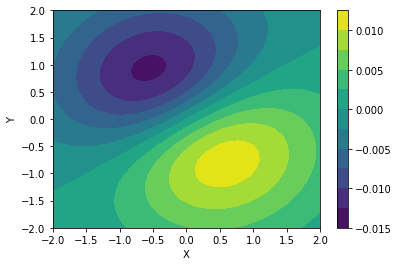

In [32]:
plt.contourf(arr,arr,integ.reshape((len(arr), len(arr), len(arr)))[:,:,0], levels=10)
plt.colorbar()
plt.xlabel("X")
plt.ylabel("Y")
plt.show()

<font color='blue'>**3-iv) Calculate the real and imaginary value of the integrant for different value of $l_{max}$, for a given k. Plot the result.**

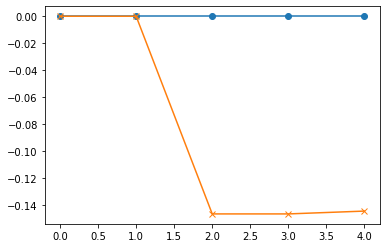

In [22]:
# lmax dependance
re = []
imag = []
max = 2.
k = 1

for lmax in [0,1,2,3,4]:
    re.append(triple_trap_grid(60,-max,max,integrant_cart, lmax, k, True, dys_oh, mol_oh, None))
    imag.append(triple_trap_grid(60,-max,max,integrant_cart, lmax, k, False, dys_oh, mol_oh, None))

plt.plot(re, '-o')
plt.plot(imag, '-x')
plt.show()

<font color='blue'>**3-iv) Calculate the photoionization cross section of OH $^-$ using either the Dyson or the HF orbital. Perform the calculation for various values of k. Plot the result.**

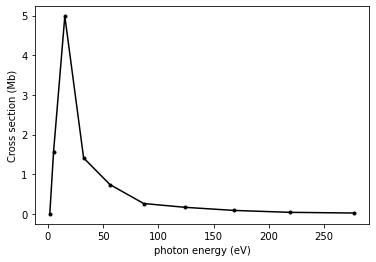

In [85]:
k_vector = np.linspace(0,4.5,10)
Etot = []
sig = []
IE = (1.8/27.2114)# in au
max = 5
lmax = 3
lmax = 3

for k in k_vector:
  ek = k**2/2
  Etot.append(ek+IE)  
  real = triple_trap_grid(60,-max,max,integrant_cart, lmax, k, True, dys_oh, mol_oh, None)
  imag = triple_trap_grid(60,-max,max,integrant_cart, lmax, k, False, dys_oh, mol_oh, None)
  d2 = abs(complex(real,imag))**2   #module squared of the dipole transition moment
  sig.append((((4*np.pi**2)*Etot[-1])*d2/137))

# convert to eV
Etot_ev = np.asarray(Etot)*27.2114
sig_ev = np.asarray(sig)*27.2114

#plot
plt.xlabel('photon energy (eV)') 
plt.ylabel('Cross section (Mb)')
plt.plot(Etot_ev,sig_ev,'k.-')
plt.show()

## 4) The atomic case: photoionization of the 1s orbital of Neon.

The following lines of code store the molecular coefficients (or LCAO coefficients) of the 1s HF orbital of Ne $^-$ in the variable *Ne_1s*. The energy of the orbital is stored in the variable *Ne_1s_ene* and corresponds, within our Koopman approach, to the ionization energy.

In [17]:
# store coefficient for the 1s orbital of Ne

mol_ne = gto.M(atom='Ne', spin=0, charge=0, basis = '6-31g')

mf_ne = scf.RHF(mol_ne)
mf_ne.run()

#homo coefficients
coeff_ne = mf_ne.mo_coeff[:,0]
Ne_1s = coeff_ne.reshape((coeff_ne.shape[0],1))

Ne_1s_IE = -mf_ne.mo_energy[0]

converged SCF energy = -128.473876870668


<font color='blue'>**4-i) Use the function *get_orb_pts* to calculate the value of the atomic orbital on a grid. Then plot it on a 3D surface.**

In [7]:
lim=0.8

x = np.linspace(-lim,lim,30)
y = np.linspace(-lim,lim,30)
z = np.linspace(-lim,lim,30)
X,Y,Z = np.meshgrid(x, y, z)

orb_grid = get_orb_pts(Ne_1s, mol_ne, (x,y,z),grid=True)
orb_grid = np.abs(orb_grid)**2

fig= go.Figure(data=go.Isosurface(
    x=X.flatten(),
    y=Y.flatten(),
    z=Z.flatten(),
    value=orb_grid.flatten(),
    opacity=0.6,
    isomin=np.min(orb_grid),
    isomax=0.1,#np.max(oh_dys_prob),
    surface_count=9,
    caps=dict(x_show=False, y_show=False)
    ))

#fig.update_scenes(xaxis_visible=False, yaxis_visible=False,zaxis_visible=False )
fig.show()

<font color='blue'>**4-ii) Calculate the real and imaginary value of the integrant for different value of $l_{max}$, for a given k. Plot the result.**

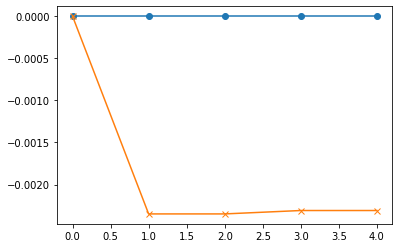

In [23]:
# lmax dependance
re = []
imag = []
max = 2.
k = 1

for lmax in [0,1,2,3,4]:
    re.append(triple_trap_grid(60,-max,max,integrant_cart, lmax, k, True, Ne_1s, mol_ne, None))
    imag.append(triple_trap_grid(60,-max,max,integrant_cart, lmax, k, False, Ne_1s, mol_ne, None))

plt.plot(re, '-o')
plt.plot(imag, '-x')
plt.show()

<font color='blue'>**4-iii) Calculate the the photoionization cross section as you did for OH-. Plot the result.**

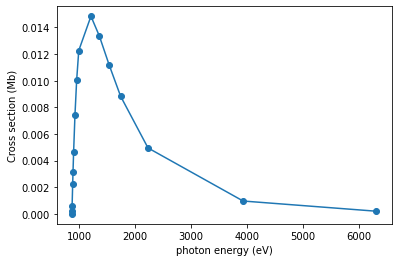

In [113]:
# calculate total cross section for several values of k using numerical integration in cartesian coordinates

#k_vector = np.linspace(0,10,30)
k_vector = [0,0.3,0.5,1,1.2,1.5,2,2.5,3,5,6,7,8,10,15,20]

#IE_Ne_1s = Ne_1s_ene
IE_Ne_1s = 32
Ne_1s_sig = []
etot_Ne_1s = [] 
max = 1.1
lmax = 2
real = []
imag = []
d = []
EK_num = []

for k in k_vector:
  ek = k**2/2
  EK_num.append(ek)
  etot_Ne_1s.append((ek+IE_Ne_1s))  
  re = triple_trap_grid(60,-max,max,integrant_cart, lmax, k, True, coeff_Ne, mol, None)
  im = triple_trap_grid(60,-max,max,integrant_cart, lmax, k, False, coeff_Ne, mol, None)
  real.append(re)
  imag.append(im)
  d2 = abs(complex(re,im))**2   #module squared of the dipole transition moment
  d.append(d2)
  Ne_1s_sig.append(((4*(np.pi**2)*d2/137)*etot_Ne_1s[-1])) 

# convert to eV
etot_Ne_1s_np_num = np.array(etot_Ne_1s)*27.2114
Ne1s_sig_np_num = np.array(Ne_1s_sig)*27.2114

#plot 
plt.xlabel('photon energy (eV)')
plt.ylabel('Cross section (Mb)')
plt.plot(etot_Ne_1s_np_num,Ne1s_sig_np_num, '-o')
#plt.xlim(1000,6000)
plt.show()

### Theory part IV: using hydrogenoid wave function

The problem can be simplified by taking advantage of the properties of the spherical harmonics. The radial and angular part can be seperated in the expression of the transition dipole moment:

$$|<\Phi_e(r)\Phi_e(\theta,\phi)|\vec{r}|\Phi_i(r)\Phi_i(\theta,\phi)>|^2$$

using the partial wave expansion for $\Phi_e$ and accounting for the fact we only want the z component of $\vec{r}$ we have:

$$|\sum_{l=0}^{l_{max}}\sum_{ml=-l}^{+l}<i^lj_l(kr)Y_{l}^{m}(\theta,\phi)|r\,cos(\phi)|R_{\Phi_i}(r)Y_{l'}^{m'}(\theta,\phi)>|^2.$$

where $l'$ and $m'$ are the quantum number associated to the initial orbital $i$ (in our first example $\Phi_i=1s$ and $l_3=m_3=0$). 

Expressing $cos(\phi)$, the angular part of $r_z$, in spherical harmonic basis yields $cos(\phi)=\sqrt{\frac{4\pi}{3}}Y_{10}(\theta,\phi)$. The integral becomes:

$$|\sqrt{\frac{4\pi}{3}}\,\,\sum_{l=0}^{lmax}\sum_{ml=-l}^{+l}<i^lj_l(kr)|r|R_{\Phi_i}(r)><Y_{l}^{m}|Y_{1}^{0}|Y_{l'}^{m'}>|^2$$

the factor involving the 3 spherical harmonics can be simplified using the $\textit{integral over three spherical harmonics}$ relation from angular momentum theory which reads:

$$\sqrt{\frac{(2l+1)(2l_2+1)}{4\pi(2l'+1)}}CG(l\,l_2\,l';m\,m_2\,m')CG(l\,l_2\,l';000) $$

where $CG$ are the Clebsh-Gordan coefficients and $l, m$ are the angular momentum associated to the ejected electron, $l_2, m_2$ are the angular momentum of the photon, and $l', m'$ are the angular momentum of the initial orbital. The function $cgc(l,m,l2,m2,l',m')$ returns the result for a set of angular momentum.
For example:

In [86]:
print(cgc(1,0,1,0,0,0))
print(cgc(1,0,1,1,1,1))

-0.577350269189626
-0.707106781186548


The function *ang_part(j1,m1,j2,m2,j3,m3)* has been implemented and can be used to directly evaluate the integral over 3 sphercial harmonics. Example:

In [87]:
ang_part(1,0,1,0,0,0)

0.282094791773878

<font color='green'>**4-iv) Write a function that returns the radial part of hydrogen wave function for a effective nuclear charge.**

In [88]:
def rad_Ne_1s(r,*arg):
    
    l = arg[0]
    k = arg[1]
    real = arg[2]
    
    jl = special.spherical_jn
    
    ans  = 1
    ans *= np.conj(jl(l,k*r)*(complex(0,1)**l))
    ans *= r**3
    ans *= Psi(1,0,0,r,0,0,9.642)[1]    #Ne-1s orbital
    
    if real:
      return ans.real
    else:
      return ans.imag

<font color='blue'>**4-iii) Calculate the the photoionization cross section using the equations derived in *Theory part IV*. Plot the result.**

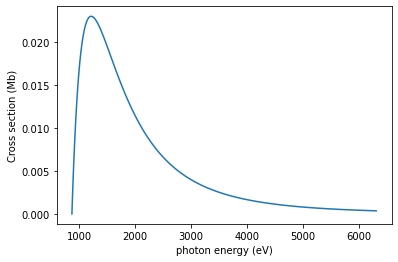

In [89]:
rf = 2.0

k_vector = np.linspace(0,20,100)
#IE_Ne_1s = ((9.642**2)/2)# in au
IE_Ne_1s = 32
Ne_1s_sig = []
i = complex(0,1)
etot_Ne_1s = []
EK_ana = []
lmax=1
d_ana = []

for k in k_vector:
  ek = (k**2/2)# in au
  EK_ana.append(ek)
  etot_Ne_1s.append((ek+IE_Ne_1s))  
  
  real = complex(0,0)
  imag = complex(0,0)
  
  sum = complex(0,0)
  # only l=1, ml=0 contribute
  for l in range(lmax+1):
    for ml in range(-l,l+1,1):
      ang = ang_part(l,ml,1,0,0,0)*np.sqrt(4*np.pi/3)  
      real += integrate.quad(rad_Ne_1s, 0, rf,(l,k,True))[0]*ang
      imag += integrate.quad(rad_Ne_1s, 0, rf,(l,k,False))[0]*ang  
  d2=np.abs(real+imag)**2
  d_ana.append(d2)
  Ne_1s_sig.append(((4*(np.pi**2)*d2/137)*etot_Ne_1s[-1]))

# to eV
etot_Ne_1s_np = np.array(etot_Ne_1s)*27.2114
Ne1s_sig_np = np.array(Ne_1s_sig)*27.2114

#plot 
plt.xlabel('photon energy (eV)')
plt.ylabel('Cross section (Mb)')
plt.plot(etot_Ne_1s_np,Ne1s_sig_np)
plt.show()

<font color='blue'>**4-v) Compare both results on a plot.**

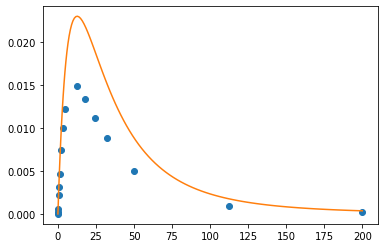

In [116]:
plt.plot(EK_num, Ne1s_sig_np_num, 'o')
plt.plot(EK_ana, Ne1s_sig_np)
plt.show()